# Notebook to run Annotation Human Heart to Mouse Heart - Cardiomyocytes

**Created by** : Srivalli Kolla

**Created on** : 2 October, 2024

**Modified on** : 4 October, 2024

**Institute of Systems Immunology, University of Würzburg**

Env : scvi-env

# Import Packages

In [1]:
import scvi
import torch
import anndata
import warnings
import time
import datetime
import numpy as np
import scanpy as sc
import pandas as pd
import plotnine as p
import scib_metrics
import scib
import faiss
import matplotlib.pyplot as plt

from scib_metrics.nearest_neighbors import NeighborsResults
from pywaffle import Waffle
from scib_metrics.benchmark import Benchmarker, BioConservation

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

timestamp = datetime.datetime.now().strftime("%d_%m_%y")

-----
anndata     0.10.8
scanpy      1.10.2
-----
Cython              3.0.11
PIL                 10.3.0
absl                NA
asttokens           NA
attr                23.2.0
chex                0.1.86
colorama            0.4.6
comm                0.2.2
contextlib2         NA
cycler              0.12.1
cython              3.0.11
cython_runtime      NA
dateutil            2.9.0.post0
debugpy             1.8.2
decorator           5.1.1
deprecated          1.2.14
django              5.0.6
docrep              0.3.2
etils               1.9.2
executing           2.0.1
faiss               1.8.0
filelock            3.15.4
flax                0.8.5
fsspec              2024.6.1
h5py                3.11.0
igraph              0.11.6
importlib_resources NA
ipykernel           6.29.5
ipywidgets          8.1.5
jax                 0.4.30
jaxlib              0.4.30
jedi                0.19.1
joblib              1.4.2
kiwisolver          1.4.5
legacy_api_wrap     NA
leidenalg           0.10.2
lightnin

/home/skolla/miniforge3/envs/scvi-env/lib/python3.12/site-packages/scanpy/_settings.py:488: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
/home/skolla/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.


In [3]:
warnings.simplefilter(action = 'ignore')
scvi.settings.seed = 1712
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'

Seed set to 1712


In [4]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 2,
)


# Import Data

## Reference

In [5]:
ref_all = sc.read_h5ad('../../data/Global_raw.h5ad')
ref_all

AnnData object with n_obs × n_vars = 704296 × 32732
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches'
    var: 'gene_name-new', 'gene_name_scRNA-0-original', 'gene_name_snRNA-1-original', 'gene_name_multiome-2-original'
    uns: 'age_colors', 'cell_or_nuclei_colors', 'cell_state_colors', 'cell_type_colors', 'donor_colors', 'donor_t

In [6]:
ref_all.obs['region_finest'].value_counts()

region_finest
LV                   130304
AX                   102221
RV                    92403
SP                    88911
LA                    74501
RA                    55060
SAN                   31227
AVN                   28024
na                    23769
AVN SEPT LAT          11753
IVS MID LV             8995
LV FW ANTLAT ENDO      8274
RV FW ENDO             7949
SAN CAUD CRAN          5519
LV APEX ENDO           4905
AVN MID LAT            4844
RV FW EPI              4102
LV FW ANTLAT EPI       4039
SAN CRAN CAUD          3560
SAN MID CAUD           3482
RAA                    2435
AVN SEPT SEPT          1786
AVN LAT SEPT           1567
IVS MID RV             1118
AVN MID SEPT           1045
SAN MID CRAN           1011
LV APEX EPI             907
SAN MID                 585
Name: count, dtype: int64

In [7]:
ref_all.obs['cell_or_nuclei'].value_counts()

cell_or_nuclei
Nuclei    568598
Cell      135698
Name: count, dtype: int64

In [8]:
ref_all.obs['cell_type'].value_counts()

cell_type
Ventricular Cardiomyocyte     190710
Fibroblast                    138055
Endothelial cell              131505
Mural cell                    104593
Myeloid                        51426
Atrial Cardiomyocyte           45911
Lymphoid                       24922
Neural cell                     6622
Adipocyte                       6347
Mast cell                       1853
Lymphatic Endothelial cell      1295
Mesothelial cell                1057
Name: count, dtype: int64

### Subsetting data

In [9]:
ref = ref_all[(ref_all.obs['region_finest'] == 'LV') & (ref_all.obs['cell_type'] == 'Ventricular Cardiomyocyte') & (ref_all.obs['cell_or_nuclei'] == 'Nuclei')]
ref

View of AnnData object with n_obs × n_vars = 54258 × 32732
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches'
    var: 'gene_name-new', 'gene_name_scRNA-0-original', 'gene_name_snRNA-1-original', 'gene_name_multiome-2-original'
    uns: 'age_colors', 'cell_or_nuclei_colors', 'cell_state_colors', 'cell_type_colors', 'donor_colors', '

In [10]:
ref.obs['cell_state'].value_counts()

cell_state
vCM1             35729
vCM3_stressed     8061
vCM2              6746
vCM4              3619
vCM5                77
unclassified        26
Name: count, dtype: int64

In [11]:
ref.obs['region_finest'].value_counts()

region_finest
LV    54258
Name: count, dtype: int64

In [12]:
ref.obs['cell_or_nuclei'].value_counts()

cell_or_nuclei
Nuclei    54258
Name: count, dtype: int64

In [13]:
ref.obs['facility'].value_counts()

facility
Harvard    28051
Sanger     26207
Name: count, dtype: int64

In [14]:
ref = ref[ref.obs['cell_state'].isin(['vCM1','vCM2', 'vCM4', 'vCM3_stressed', 'vCM5'])]
ref

View of AnnData object with n_obs × n_vars = 54232 × 32732
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches'
    var: 'gene_name-new', 'gene_name_scRNA-0-original', 'gene_name_snRNA-1-original', 'gene_name_multiome-2-original'
    uns: 'age_colors', 'cell_or_nuclei_colors', 'cell_state_colors', 'cell_type_colors', 'donor_colors', '

In [15]:
ref.obs['cell_state'].value_counts()

cell_state
vCM1             35729
vCM3_stressed     8061
vCM2              6746
vCM4              3619
vCM5                77
Name: count, dtype: int64

In [16]:
ref.obs['sample'] = ref.obs['donor'].copy()

In [17]:
ref.obs['seed_labels'] = ref.obs['cell_state'].copy()
ref.obs['seed_labels'].value_counts()
ref.obs['seed_labels'].cat.categories

Index(['vCM1', 'vCM2', 'vCM3_stressed', 'vCM4', 'vCM5'], dtype='object')

In [18]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

In [19]:
print(X_is_raw(ref))

True


In [20]:
ref.layers['raw_counts'] = ref.X
ref

AnnData object with n_obs × n_vars = 54232 × 32732
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches', 'sample', 'seed_labels'
    var: 'gene_name-new', 'gene_name_scRNA-0-original', 'gene_name_snRNA-1-original', 'gene_name_multiome-2-original'
    uns: 'age_colors', 'cell_or_nuclei_colors', 'cell_state_colors', 'cell_type_colors', 

In [21]:
sc.pp.filter_cells(ref, min_genes = 200)
sc.pp.filter_cells(ref, min_counts = 100)
ref

AnnData object with n_obs × n_vars = 54232 × 32732
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches', 'sample', 'seed_labels'
    var: 'gene_name-new', 'gene_name_scRNA-0-original', 'gene_name_snRNA-1-original', 'gene_name_multiome-2-original'
    uns: 'age_colors', 'cell_or_nuclei_colors', 'cell_state_colors', 'cell_type_colors', 

In [22]:
sc.pp.highly_variable_genes(ref,    flavor = "seurat_v3",
    n_top_genes = 8000,
    layer = "raw_counts",
    batch_key = "sample", span= 1 , subset= True )

ref

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 54232 × 8000
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches', 'sample', 'seed_labels'
    var: 'gene_name-new', 'gene_name_scRNA-0-original', 'gene_name_snRNA-1-original', 'gene_name_multiome-2-original', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highl

## Query

In [23]:
query_all = sc.read_h5ad('../../data/dmd_heart_after_cb_qc_02_10_2024.h5ad')
query_all

AnnData object with n_obs × n_vars = 124921 × 32285
    obs: 'sample', 'genotype', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', 'sample_colors'
    layers: 'normalized', 'raw_counts'

### Subsetting data

In [24]:
query = query_all[query_all.obs['genotype'] == 'WT']
query

View of AnnData object with n_obs × n_vars = 61606 × 32285
    obs: 'sample', 'genotype', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', 'sample_colors'
    layers: 'normalized', 'raw_counts'

In [25]:
query.obs['seed_labels'] = 'Unknown'

In [26]:
print (X_is_raw(query))

False


In [27]:
query.X = query.layers['raw_counts']

In [28]:
print (X_is_raw(query))

True


In [29]:
sc.pp.filter_cells(query, min_genes = 200)
sc.pp.filter_cells(query, min_counts = 100)
query

AnnData object with n_obs × n_vars = 61606 × 32285
    obs: 'sample', 'genotype', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase', 'seed_labels', 'n_genes', 'n_counts'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', 'sample_colors'
    layers: 'normalized', 'raw_counts'

### Checking vars

In [30]:
query.var

,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
Xkr4,False,False,2530,0.043516,98.656214,8193
Gm1992,False,False,300,0.002071,99.840658,390
Gm19938,False,False,317,0.001859,99.831628,350
Gm37381,False,False,72,0.000600,99.961758,113
Rp1,False,False,892,0.009895,99.526222,1863
...,...,...,...,...,...,...
AC124606.1,False,False,0,0.000000,100.000000,0
AC133095.2,False,False,0,0.000000,100.000000,0
AC133095.1,False,False,0,0.000000,100.000000,0
AC234645.1,False,False,0,0.000000,100.000000,0


In [31]:
ref.var

,gene_name-new,gene_name_scRNA-0-original,gene_name_snRNA-1-original,gene_name_multiome-2-original,highly_variable,highly_variable_rank,means,variances,variances_norm,highly_variable_nbatches
ENSG00000238009,AL627309.1,AL627309.1,AL627309.1,AL627309.1,True,3224.5,0.020339,0.020921,1.001116,6
ENSG00000229905,AL669831.2,AL669831.2,AL669831.2,AL669831.2,True,1228.0,0.000867,0.000903,0.474612,1
ENSG00000237491,LINC01409,AL669831.5,AL669831.5,LINC01409,True,2963.0,0.089763,0.098487,0.944457,3
ENSG00000272438,AL645608.6,AL645608.7,AL645608.7,AL645608.6,True,1112.0,0.000258,0.000479,0.542014,1
ENSG00000188976,NOC2L,NOC2L,NOC2L,NOC2L,True,3035.0,0.096843,0.104689,0.888894,1
...,...,...,...,...,...,...,...,...,...,...
ENSG00000198695,MT-ND6,MT-ND6,MT-ND6,MT-ND6,True,3196.0,0.005126,0.005432,0.818762,5
ENSG00000198727,MT-CYB,MT-CYB,MT-CYB,MT-CYB,True,19.0,0.243417,4.090200,3.553938,14
ENSG00000273554,AC136616.1,AC136616.1,AC136616.1,AC136616.1,True,906.0,0.026258,0.043344,1.100645,10
ENSG00000273748,AL592183.1,AL592183.1,AL592183.1,AL592183.1,True,3383.0,0.505937,0.778449,0.899700,1


In [32]:
query.var_names = [gene_name.upper() for gene_name in query.var_names]
query.var_names

Index(['XKR4', 'GM1992', 'GM19938', 'GM37381', 'RP1', 'SOX17', 'GM37587',
       'GM37323', 'MRPL15', 'LYPLA1',
       ...
       'GM16367', 'AC163611.1', 'AC163611.2', 'AC140365.1', 'AC124606.2',
       'AC124606.1', 'AC133095.2', 'AC133095.1', 'AC234645.1', 'AC149090.1'],
      dtype='object', length=32285)

In [33]:
ref.var.index = ref.var['gene_name_snRNA-1-original'].astype(object)
ref.var_names

Index(['AL627309.1', 'AL669831.2', 'AL669831.5', 'AL645608.7', 'NOC2L', 'SDF4',
       'UBE2J2', 'CPTP', 'AURKAIP1', 'MRPL20',
       ...
       'MT-CO3', 'MT-ND3', 'MT-ND4L', 'MT-ND4', 'MT-ND5', 'MT-ND6', 'MT-CYB',
       'AC136616.1', 'AL592183.1', 'AC004556.1'],
      dtype='object', name='gene_name_snRNA-1-original', length=8000)

# Data concatenation

#### Checking for duplicates

In [34]:
unique_var = ~ref.var.index.duplicated(keep='first')
ref = ref[:, unique_var]

In [35]:
adata = ref.concatenate(query, batch_key = 'batch', batch_categories = ['reference', 'query'], join = 'inner', index_unique= '-' )
adata

AnnData object with n_obs × n_vars = 115838 × 5424
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches', 'sample', 'seed_labels', 'genotype', 'doublet_scores', 'predicted_doublets', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase'
    var: 'mt-query', 'ribo-query', 'n_cells_by_count

In [36]:
adata.var

,mt-query,ribo-query,n_cells_by_counts-query,mean_counts-query,pct_dropout_by_counts-query,total_counts-query,gene_name-new-reference,gene_name_scRNA-0-original-reference,gene_name_snRNA-1-original-reference,gene_name_multiome-2-original-reference,highly_variable-reference,highly_variable_rank-reference,means-reference,variances-reference,variances_norm-reference,highly_variable_nbatches-reference
NOC2L,False,False,4333,0.025468,97.698567,4795,NOC2L,NOC2L,NOC2L,NOC2L,True,3035.0,0.096843,0.104689,0.888894,1
SDF4,False,False,11908,0.075693,93.675176,14251,SDF4,SDF4,SDF4,SDF4,True,3296.0,0.088933,0.097289,0.887656,1
UBE2J2,False,False,8693,0.054994,95.382793,10354,UBE2J2,UBE2J2,UBE2J2,UBE2J2,True,2751.0,0.104735,0.117333,0.921625,1
CPTP,False,False,608,0.003336,99.677066,628,CPTP,CPTP,CPTP,CPTP,True,2924.0,0.058840,0.070536,1.025062,8
AURKAIP1,False,False,10548,0.059801,94.397527,11259,AURKAIP1,AURKAIP1,AURKAIP1,AURKAIP1,True,3221.0,0.076542,0.084182,0.932729,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-ND3,True,False,153550,3.305810,18.443333,622398,MT-ND3,MT-ND3,MT-ND3,MT-ND3,True,32.0,0.178677,3.700441,3.382094,15
MT-ND4L,True,False,102030,0.890962,45.807706,167745,MT-ND4L,MT-ND4L,MT-ND4L,MT-ND4L,True,1422.0,0.012244,0.018142,1.112596,9
MT-ND4,True,False,165495,8.503097,12.098856,1600912,MT-ND4,MT-ND4,MT-ND4,MT-ND4,True,16.0,0.162192,2.749818,3.202871,15
MT-ND5,True,False,141320,2.045901,24.939184,385190,MT-ND5,MT-ND5,MT-ND5,MT-ND5,True,416.0,0.032767,0.166119,1.407539,12


In [37]:
adata.obs['seed_labels'].value_counts()

seed_labels
Unknown          61606
vCM1             35729
vCM3_stressed     8061
vCM2              6746
vCM4              3619
vCM5                77
Name: count, dtype: int64

In [38]:
adata.obs['sample'].value_counts()

sample
A10_2    57340
H6        8075
H5        5674
D1        5166
H3        4424
A9_2      4266
D7        4218
H7        4020
D8        3637
D3        3564
H4        3212
D5        3118
D4        2677
H2        2635
D2        2576
D6        1080
D11        156
Name: count, dtype: int64

In [39]:
adata.obs['batch'].value_counts()

batch
query        61606
reference    54232
Name: count, dtype: int64

In [40]:
adata.obs['region_finest'].value_counts()

region_finest
LV    54232
Name: count, dtype: int64

In [41]:
adata.obs['cell_or_nuclei'].value_counts()

cell_or_nuclei
Nuclei    54232
Name: count, dtype: int64

In [42]:
adata.obs['facility'].value_counts()

facility
Harvard    28040
Sanger     26192
Name: count, dtype: int64

In [43]:
print(X_is_raw(adata))

True


In [44]:
adata_raw = adata.copy()

In [45]:
adata.layers['raw_counts'] = adata.X.copy()

In [46]:
sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 8000,
    layer = "raw_counts",
    batch_key = "sample", span= 1, subset= True)

adata

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 115838 × 5424
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches', 'sample', 'seed_labels', 'genotype', 'doublet_scores', 'predicted_doublets', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase'
    var: 'mt-query', 'ribo-query', 'n_cells_by_count

## PCA

In [47]:
sc.pp.pca(adata)

computing PCA
    with n_comps=50
    finished (0:00:14)


# SCVI

In [48]:
scvi.model.SCVI.setup_anndata(adata, 
                              labels_key = 'seed_labels',
                              layer = 'raw_counts',
                              categorical_covariate_keys = ['sample', 'batch'])
adata

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


AnnData object with n_obs × n_vars = 115838 × 5424
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches', 'sample', 'seed_labels', 'genotype', 'doublet_scores', 'predicted_doublets', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase'
    var: 'mt-query', 'ribo-query', 'n_cells_by_count

In [49]:
model_scvi = scvi.model.SCVI(adata, 
                             dispersion = 'gene-batch', 
                             gene_likelihood = 'nb')
model_scvi

SCVI model with the following parameters: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene-batch, gene_likelihood: nb, 
latent_distribution: normal.
Training status: Not Trained
Model's adata is minified?: False

In [50]:
model_scvi.view_anndata_setup()

Anndata setup with scvi-tools version 1.1.5.

Setup via `SCVI.setup_anndata` with arguments:

{
│   'layer': 'raw_counts',
│   'batch_key': None,
│   'labels_key': 'seed_labels',
│   'size_factor_key': None,
│   'categorical_covariate_keys': ['sample', 'batch'],
│   'continuous_covariate_keys': None
}

         Summary Statistics          
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃     Summary Stat Key     ┃ Value  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│         n_batch          │   1    │
│         n_cells          │ 115838 │
│ n_extra_categorical_covs │   2    │
│ n_extra_continuous_covs  │   0    │
│         n_labels         │   6    │
│          n_vars          │  5424  │
└──────────────────────────┴────────┘

                             Data Registry                             
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Registry Key      ┃            scvi-tools Location             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           X            │         adata.layers['raw_counts']         │
│         batch          │          adata.obs['_scvi_batch']          │
│ extra_categorical_covs │ adata.obsm['_scvi_extra_categorical_covs'] │
│         labels         │         adata.obs['_scvi_labels']          │
└────────────────────────┴────────────────────────────────────────────┘

                     batch State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃     Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_batch'] │     0      │          0          │
└──────────────────────────┴────────────┴─────────────────────┘

                      labels State Registry                       
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃     Source Location      ┃  Categories   ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['seed_labels'] │    Unknown    │          0          │
│                          │     vCM1      │          1          │
│                          │     vCM2      │          2          │
│                          │ vCM3_stressed │          3          │
│                          │     vCM4      │          4          │
│                          │     vCM5      │          5          │
└──────────────────────────┴───────────────┴─────────────────────┘

          extra_categorical_covs State Registry           
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['batch']  │ reference  │          0          │
│                     │   query    │          1          │
│                     │            │                     │
│ adata.obs['sample'] │    A9_2    │          0          │
│                     │   A10_2    │          1          │
│                     │     D1     │          2          │
│                     │     D2     │          3          │
│                     │     D3     │          4          │
│                     │     D4     │          5          │
│                     │     D5     │          6          │
│                     │     D6     │          7          │
│                     │     D7     │          8          │
│                     │     D8     │          9          │
│                     │    D11     │         10          │
│                     │     H2     │         11          │
│                     │     H3     │         12          │
│                     │     H4     │         13          │
│                     │     H5     │         14          │
│                     │     H6     │         15          │
│                     │     H7     │         16          │
│                     │            │                     │
└─────────────────────┴────────────┴─────────────────────┘

In [51]:
max_epochs_scvi = np.min([round((20000 / adata.n_obs) * 400), 400])
max_epochs_scvi

69

In [52]:
model_scvi.train(accelerator= 'gpu', devices= [1],check_val_every_n_epoch = 1, enable_progress_bar = True,)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA RTX 6000 Ada Generation') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 69/69: 100%|██████████| 69/69 [05:49<00:00,  4.70s/it, v_num=1, train_loss_step=1.4e+3, train_loss_epoch=1.38e+3] 

`Trainer.fit` stopped: `max_epochs=69` reached.


Epoch 69/69: 100%|██████████| 69/69 [05:49<00:00,  5.07s/it, v_num=1, train_loss_step=1.4e+3, train_loss_epoch=1.38e+3]


In [53]:
model_scvi.save('./', overwrite=True, prefix= 'scvi')

## Evaluate model performance a la Sevensson

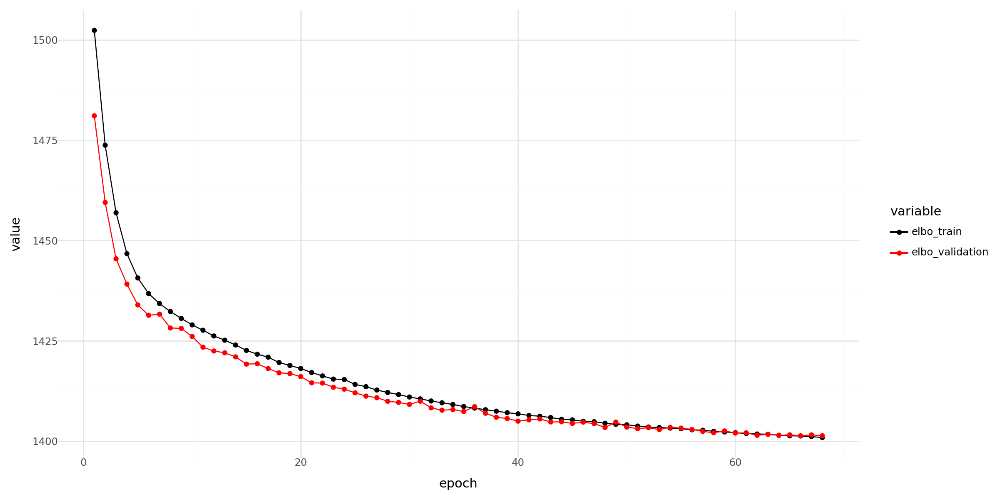

In [54]:
history_df = (
    model_scvi.history['elbo_train'].astype(float)
    .join(model_scvi.history['elbo_validation'].astype(float))
    .reset_index()
    .melt(id_vars = ['epoch'])
)

p.options.figure_size = 12, 6

p_ = (
    p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 0'))
    + p.geom_line()
    + p.geom_point()
    + p.scale_color_manual({'elbo_train': 'black', 'elbo_validation': 'red'})
    + p.theme_minimal()
)

p_.save('./scvi_la_sevensson.png', dpi = 300)

print(p_)

In [55]:
adata.obsm["X_scVI"] = model_scvi.get_latent_representation()

In [56]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata)
adata

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:24)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:42)


AnnData object with n_obs × n_vars = 115838 × 5424
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches', 'sample', 'seed_labels', 'genotype', 'doublet_scores', 'predicted_doublets', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase'
    var: 'mt-query', 'ribo-query', 'n_cells_by_count

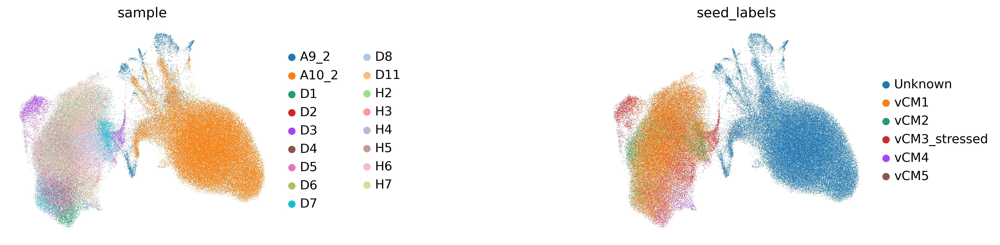

In [57]:
sc.pl.umap(adata, color=['sample', 'seed_labels'], wspace=1, frameon = False)

# scANVI

In [58]:
model_scanvi = scvi.model.SCANVI.from_scvi_model(model_scvi,unlabeled_category= 'Unknown', labels_key= 'seed_labels')

In [59]:
model_scanvi.view_anndata_setup()

Anndata setup with scvi-tools version 1.1.5.

Setup via `SCANVI.setup_anndata` with arguments:

{
│   'labels_key': 'seed_labels',
│   'unlabeled_category': 'Unknown',
│   'layer': 'raw_counts',
│   'batch_key': None,
│   'size_factor_key': None,
│   'categorical_covariate_keys': ['sample', 'batch'],
│   'continuous_covariate_keys': None
}

         Summary Statistics          
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃     Summary Stat Key     ┃ Value  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│         n_batch          │   1    │
│         n_cells          │ 115838 │
│ n_extra_categorical_covs │   2    │
│ n_extra_continuous_covs  │   0    │
│         n_labels         │   6    │
│          n_vars          │  5424  │
└──────────────────────────┴────────┘

                             Data Registry                             
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Registry Key      ┃            scvi-tools Location             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           X            │         adata.layers['raw_counts']         │
│         batch          │          adata.obs['_scvi_batch']          │
│ extra_categorical_covs │ adata.obsm['_scvi_extra_categorical_covs'] │
│         labels         │         adata.obs['_scvi_labels']          │
└────────────────────────┴────────────────────────────────────────────┘

                     batch State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃     Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_batch'] │     0      │          0          │
└──────────────────────────┴────────────┴─────────────────────┘

                      labels State Registry                       
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃     Source Location      ┃  Categories   ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['seed_labels'] │     vCM5      │          0          │
│                          │     vCM1      │          1          │
│                          │     vCM2      │          2          │
│                          │ vCM3_stressed │          3          │
│                          │     vCM4      │          4          │
│                          │    Unknown    │          5          │
└──────────────────────────┴───────────────┴─────────────────────┘

          extra_categorical_covs State Registry           
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['batch']  │ reference  │          0          │
│                     │   query    │          1          │
│                     │            │                     │
│ adata.obs['sample'] │    A9_2    │          0          │
│                     │   A10_2    │          1          │
│                     │     D1     │          2          │
│                     │     D2     │          3          │
│                     │     D3     │          4          │
│                     │     D4     │          5          │
│                     │     D5     │          6          │
│                     │     D6     │          7          │
│                     │     D7     │          8          │
│                     │     D8     │          9          │
│                     │    D11     │         10          │
│                     │     H2     │         11          │
│                     │     H3     │         12          │
│                     │     H4     │         13          │
│                     │     H5     │         14          │
│                     │     H6     │         15          │
│                     │     H7     │         16          │
│                     │            │                     │
└─────────────────────┴────────────┴─────────────────────┘

In [60]:
max_epochs_scanvi = int(np.min([10, np.max([2, round(max_epochs_scvi / 3.0)])]))
max_epochs_scanvi

10

In [61]:
model_scanvi.train(80, devices= [1], accelerator= 'gpu',check_val_every_n_epoch = 1, enable_progress_bar = True, )

INFO     Training for 80 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 80/80: 100%|██████████| 80/80 [13:55<00:00, 10.48s/it, v_num=1, train_loss_step=1.38e+3, train_loss_epoch=1.38e+3]

`Trainer.fit` stopped: `max_epochs=80` reached.


Epoch 80/80: 100%|██████████| 80/80 [13:55<00:00, 10.44s/it, v_num=1, train_loss_step=1.38e+3, train_loss_epoch=1.38e+3]


In [62]:
model_scanvi.save('./', overwrite=True, prefix= 'scanvi')

In [63]:
adata.obsm["X_scANVI"] = model_scanvi.get_latent_representation()

## Evaluate model performance a la Svensson

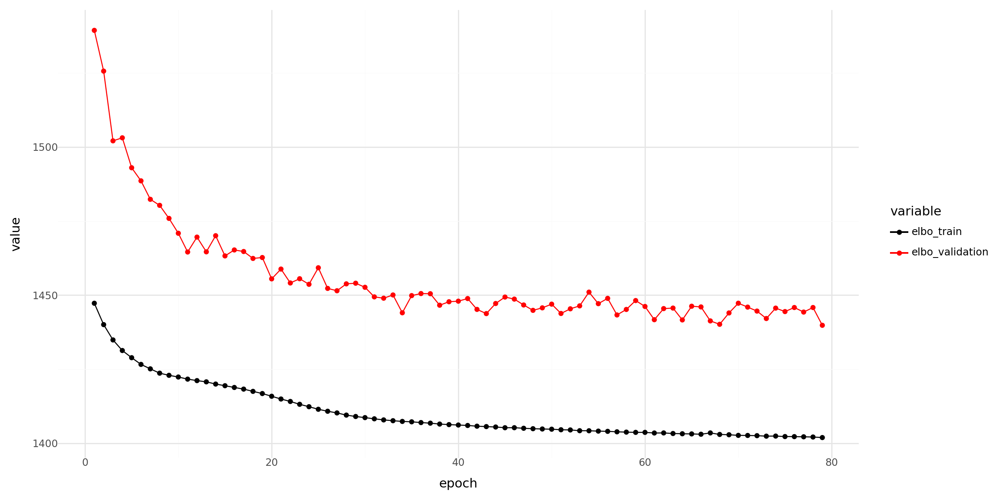

In [64]:
history_df = (
    model_scanvi.history['elbo_train'].astype(float)
    .join(model_scanvi.history['elbo_validation'].astype(float))
    .reset_index()
    .melt(id_vars = ['epoch'])
)

p.options.figure_size = 12, 6

p_ = (
    p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 0'))
    + p.geom_line()
    + p.geom_point()
    + p.scale_color_manual({'elbo_train': 'black', 'elbo_validation': 'red'})
    + p.theme_minimal()
)

p_.save('scanvi_la_sevensson.png', dpi = 300)

print(p_)

In [65]:
adata.obs["C_scANVI"] = model_scanvi.predict(adata)

In [66]:
adata.obsm["X_scANVI"] = model_scanvi.get_latent_representation(adata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:42)


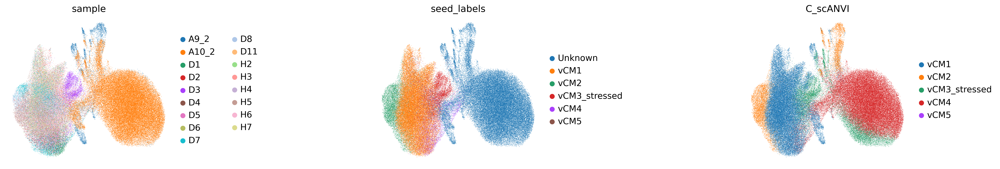

In [67]:
sc.pp.neighbors(adata, use_rep="X_scANVI")
sc.tl.umap(adata)
sc.pl.umap(adata, color=['sample', 'seed_labels',"C_scANVI"], wspace=1, frameon = False)

# Export data

In [68]:
adata_export_merged = anndata.AnnData(X = adata_raw.X, var = adata_raw.var, obs = adata.obs)
adata_export_merged

AnnData object with n_obs × n_vars = 115838 × 5424
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches', 'sample', 'seed_labels', 'genotype', 'doublet_scores', 'predicted_doublets', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase', 'C_scANVI'
    var: 'mt-query', 'ribo-query', 'n_ce

In [69]:
adata_export = adata_export_merged[adata_export_merged.obs['batch'].isin(['query'])]
adata_export

View of AnnData object with n_obs × n_vars = 61606 × 5424
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches', 'sample', 'seed_labels', 'genotype', 'doublet_scores', 'predicted_doublets', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase', 'C_scANVI'
    var: 'mt-query', 'ribo-query'

In [70]:
query_export = anndata.AnnData(X = query.X, var = query.var, obs = adata_export.obs)
query_export

AnnData object with n_obs × n_vars = 61606 × 32285
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches', 'sample', 'seed_labels', 'genotype', 'doublet_scores', 'predicted_doublets', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase', 'C_scANVI'
    var: 'mt', 'ribo', 'n_cells_by_count

In [71]:
query_export.var_names = [gene_name.capitalize() for gene_name in query_export.var_names]
query_export.var_names

Index(['Xkr4', 'Gm1992', 'Gm19938', 'Gm37381', 'Rp1', 'Sox17', 'Gm37587',
       'Gm37323', 'Mrpl15', 'Lypla1',
       ...
       'Gm16367', 'Ac163611.1', 'Ac163611.2', 'Ac140365.1', 'Ac124606.2',
       'Ac124606.1', 'Ac133095.2', 'Ac133095.1', 'Ac234645.1', 'Ac149090.1'],
      dtype='object', length=32285)

In [72]:
query_export.obs['C_scANVI'].value_counts()

C_scANVI
vCM4             47378
vCM3_stressed     7309
vCM1              3762
vCM2              3129
vCM5                28
Name: count, dtype: int64

In [73]:
query_export.obs['cell_type'] = query_export.obs['C_scANVI'].copy()
query_export.obs['cell_type'] = query_export.obs['cell_type'].replace('vCM3_stressed', 'vCM3')
query_export

AnnData object with n_obs × n_vars = 61606 × 32285
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches', 'sample', 'seed_labels', 'genotype', 'doublet_scores', 'predicted_doublets', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase', 'C_scANVI'
    var: 'mt', 'ribo', 'n_cells_by_count

In [74]:
query_export.obs['cell_type'].value_counts()

cell_type
vCM4    47378
vCM3     7309
vCM1     3762
vCM2     3129
vCM5       28
Name: count, dtype: int64

In [75]:
print(X_is_raw(query_export))

True


In [76]:
query_export.layers['raw_counts'] = query_export.X

In [77]:
sc.pp.normalize_total(query_export, target_sum= 1e6)
sc.pp.log1p(query_export)
query_export.layers['normalized'] = query_export.X

normalizing counts per cell
    finished (0:00:00)


computing PCA
    with n_comps=50
    finished (0:00:55)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:24)


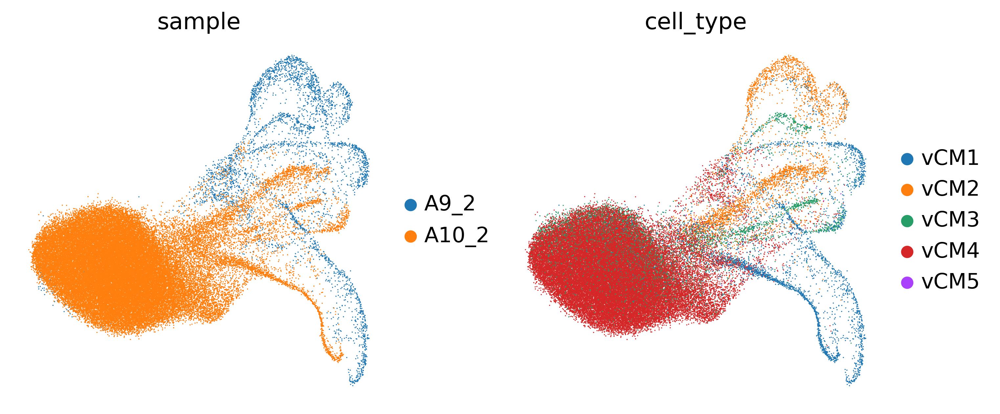

In [78]:
sc.pp.pca(query_export)
sc.pp.neighbors(query_export)
sc.tl.umap(query_export)
sc.pl.umap(query_export, color = ['sample', 'cell_type'], frameon = False)

In [79]:
query_export.write(f'../../data/dmd_annotated_cmc_wt_{timestamp}.h5ad')

# SCIB metrics

In [80]:
adata

AnnData object with n_obs × n_vars = 115838 × 5424
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches', 'sample', 'seed_labels', 'genotype', 'doublet_scores', 'predicted_doublets', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase', 'C_scANVI'
    var: 'mt-query', 'ribo-query', 'n_ce

In [81]:
scib = scib_metrics.benchmark.Benchmarker(adata, batch_key = 'sample', label_key ='C_scANVI' , embedding_obsm_keys = ['X_scVI', 'X_scANVI','X_pca'])

In [82]:
scib.benchmark()

computing PCA
    with n_comps=50
    finished (0:00:16)


Embeddings: 100%|██████████| 3/3 [24:49<00:00, 496.59s/it]


In [83]:
scib.get_results()

,Isolated labels,KMeans NMI,KMeans ARI,Silhouette label,cLISI,Silhouette batch,iLISI,KBET,Graph connectivity,PCR comparison,Batch correction,Bio conservation,Total
Embedding,,,,,,,,,,,,,
X_scVI,0.761286,0.551972,0.347718,0.095037,0.528807,1.0,0.09858,0.006537,0.787197,1.0,0.578463,0.456964,0.505564
X_scANVI,1.0,1.0,1.0,1.0,1.0,0.9124,1.0,1.0,1.0,0.563338,0.895148,1.0,0.958059
X_pca,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Metric Type,Bio conservation,Bio conservation,Bio conservation,Bio conservation,Bio conservation,Batch correction,Batch correction,Batch correction,Batch correction,Batch correction,Aggregate score,Aggregate score,Aggregate score


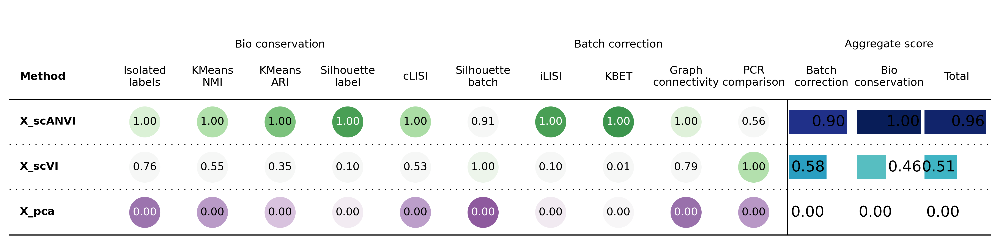

In [84]:
scib.plot_results_table()